# Jupyter Notebook to Produce Main text Figures of Paper
**Interannual Variability of Tropical Cyclones Landfall in the Eastern North Pacific. Environmental Drivers and Implications**

## Loading packages and defining some formats

In [1]:
import warnings
warnings.filterwarnings("ignore")
import xarray as xr
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import matplotlib.colors as mcolors
from matplotlib import colormaps
from matplotlib.font_manager import FontProperties
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.mpl.geoaxes import GeoAxes
import seaborn as sns
import calendar
from datetime import datetime
import cmocean

In [2]:
##### Define AxesGrid parameters
projection = ccrs.PlateCarree(central_longitude=-180)
mproj = ccrs.PlateCarree()
axes_class = (GeoAxes, dict(map_projection=projection))

###### Define SNS parameters
sns.set_style('white')
sns.set_context("paper", font_scale = 2)

In [3]:
# Colorbar normalization
class MidpointNormalize(mcolors.Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        mcolors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        v_ext = np.max( [ np.abs(self.vmin), np.abs(self.vmax) ] )
        x, y = [-v_ext, self.midpoint, v_ext], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

# White start of Cividis Color map

# Make a copy of the default 'cividis' colormap
orig_cividis = mpl.colormaps['cividis']  

# Sample 256 points between 0 and 1 from cividis
cividis_array = orig_cividis(np.linspace(0, 1, 256))

# Overwrite the first color entry with white (R=G=B=1, alpha=1)
cividis_array[0] = [1.0, 1.0, 1.0, 1.0]

# Create a new ListedColormap with the modified array
cividis_white_start = mcolors.ListedColormap(cividis_array, name='cividis_white_start')

# Load all the data

In [4]:
#Folder where you have all the data
data_dir = 'data_plots/'
### Figure 1  ###
topography = xr.open_dataarray(f"{data_dir}/topography_data.nc")
ep_filtered = xr.open_dataset(f"{data_dir}/ep_filtered.nc") #filtered version of IBTrACS
hlf_years = np.loadtxt(f"{data_dir}/hlf_years.txt", dtype=int)
llf_years = np.loadtxt(f"{data_dir}/llf_years.txt", dtype=int)
df_total_landfalls = pd.read_csv(f"{data_dir}/monthly_landfalls.csv")
df_total_genesis = pd.read_csv(f"{data_dir}/monthly_genesis.csv")

### Figure 2  ###
central_america = gpd.read_file(f"{data_dir}/central_america_states.geojson")
mexico_states = gpd.read_file(f"{data_dir}/mexico_states.json")
hlf_mun_counts = gpd.read_file(f"{data_dir}/muns_hlf_data.geojson")
hlf_landfall_points = gpd.read_file(f"{data_dir}/landfall_points_hlf.geojson")
llf_mun_counts = gpd.read_file(f"{data_dir}/muns_llf_data.geojson")
llf_landfall_points = gpd.read_file(f"{data_dir}/landfall_points_llf.geojson")

### Figure 3  ###
df_original = pd.read_csv(f"{data_dir}/fig3a.csv")  # Original data of the colorbar
df_summary = pd.read_csv(f"{data_dir}/fig3a_bserror.csv")   # Errors after the 1000 cycles of Bootstrapping
# Load wind datasets (variable names 'u' and 'v', with time, longitude, and latitude coordinates)
U_hlf = xr.open_dataset(f"{data_dir}/u_hlf.nc")
V_hlf = xr.open_dataset(f"{data_dir}/v_hlf.nc")
U_llf = xr.open_dataset(f"{data_dir}/u_llf.nc")
V_llf = xr.open_dataset(f"{data_dir}/v_llf.nc")

# Load the pprime_term dataset (coordinates: month, x, y)
pprime_ds = xr.open_dataset(f"{data_dir}/pprime_term.nc")

# Load the CSV file with mean genesis location
df_means = pd.read_csv(f"{data_dir}/mean_lat_lon.csv")


###  Figure 4   ###
u_july_climo = xr.open_dataset(f"{data_dir}/u_july_climo.nc")
v_july_climo = xr.open_dataset(f"{data_dir}/v_july_climo.nc")
dns = np.loadtxt(f"{data_dir}/dns.txt")  # size: 201, 481

#read precipitation rate data on the ITCZ box
TP_Hov_hlf = xr.open_dataset(f"{data_dir}/tp_hov_hlf.nc")
TP_Hov_llf = xr.open_dataset(f"{data_dir}/tp_hov_llf.nc")

#data for the line plot, already mean across the boxes:
df4 = pd.read_csv(f"{data_dir}/fig4d_data.csv")

# Ensure the 'month' column is numeric
df4['month'] = pd.to_numeric(df4['month'])


In [5]:
### Calculate some data to make the plots  ###
lf_yearly = np.array(df_total_landfalls.groupby('Year').sum('Total_Landfall')['Total_Landfalls'])

# Re-calculate hlf_Data and llf_Data
hlf_Data = xr.combine_nested(
    [ep_filtered.where(ep_filtered.ISO_TIME.dt.year == year + 1980, drop=True) for year in hlf_years], 
    concat_dim='index'
)
llf_Data = xr.combine_nested(
    [ep_filtered.where(ep_filtered.ISO_TIME.dt.year == year + 1980, drop=True) for year in llf_years], 
    concat_dim='index'
)
#define ini and last year of study
ini = 1980
last = 2024


# Create year list needed for some xarrays and pandas files
hlf_year_list = list(np.array(hlf_years)+ini)
llf_year_list = list(np.array(llf_years)+ini)

# Create the mean genesis for HLF and LLF
month_order = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
df_filtered = df_total_genesis[df_total_genesis['year'].isin(hlf_year_list)].copy()

# Convert the Month column to a categorical type with the desired order
df_filtered['Month'] = pd.Categorical(df_filtered['Month'], categories=month_order, ordered=True)

# Group by the ordered Month column and compute the mean
mean_gen_monthlyH = df_filtered.groupby('Month')['Genesis Count'].mean().sort_index()
# Repeat for LLF
df_filtered = df_total_genesis[df_total_genesis['year'].isin(llf_year_list)].copy()
df_filtered['Month'] = pd.Categorical(df_filtered['Month'], categories=month_order, ordered=True)
mean_gen_monthlyL = df_filtered.groupby('Month')['Genesis Count'].mean().sort_index()


# Create the mean landfall for HLF and LLF
df_filtered = df_total_landfalls[df_total_landfalls['Year'].isin(hlf_year_list)].copy()
# Convert the Month column to a categorical type with the desired order
df_filtered['Month_Abbr'] = pd.Categorical(df_filtered['Month_Abbr'], categories=month_order, ordered=True)
# Group by the ordered Month column and compute the mean
mean_hlf = df_filtered.groupby('Month_Abbr')['Total_Landfalls'].mean().sort_index()
# Repeat for LLF
df_filtered = df_total_landfalls[df_total_landfalls['Year'].isin(llf_year_list)].copy()
df_filtered['Month_Abbr'] = pd.Categorical(df_filtered['Month_Abbr'], categories=month_order, ordered=True)
mean_llf = df_filtered.groupby('Month_Abbr')['Total_Landfalls'].mean().sort_index()

## Figure 1

In [6]:
# Set up the figure and gridspec: 3 rows x 2 columns.
fig = plt.figure(figsize=(30, 20), dpi=500)
gs = gridspec.GridSpec(3, 6, height_ratios=[1.25, 1, 1], width_ratios=[0.3,1,0.95,0.95, 1,0.3])

##############################
# Panel a: High Landfall Tracks (upper left)
##############################
ax_a = plt.subplot(gs[0, 0:3], projection=ccrs.PlateCarree())
ax_a.set_facecolor('white')
ax_a.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black', zorder=2)
ax_a.add_feature(cfeature.COASTLINE, linewidth=0.5, color='black', zorder=2)
ax_a.set_extent([-133, -83, 4, 31], crs=mproj)

gl_a = ax_a.gridlines(crs=mproj, draw_labels=True, linewidth=1,
                      color='black', alpha=0.5, linestyle='--')
gl_a.xformatter = mticker.FuncFormatter(lambda x, pos: f'{x}°')
gl_a.yformatter = mticker.FuncFormatter(lambda y, pos: f'{y}°')
gl_a.xlocator = mticker.FixedLocator([-140, -120, -100, -80, -60])
gl_a.ylocator = mticker.FixedLocator([-5, 0, 5, 10, 20, 30, 40])
gl_a.xlabels_top = gl_a.ylabels_right = False
gl_a.xlines = gl_a.ylines = False
gl_a.xlabel_style = {'size': 22, 'color': 'black', 'weight': 'bold'}
gl_a.ylabel_style = {'size': 22, 'color': 'black', 'weight': 'bold'}

# Topography contourf (common to both maps)
masked_topography = np.ma.masked_less(topography.values, 2)
cm_a = ax_a.contourf(topography.longitude, topography.latitude, masked_topography,
                     transform=ccrs.PlateCarree(), cmap='terrain', alpha=1.0, zorder=2)

# Plot storm tracks from hlf_Data (high landfall years)
storm_list = np.unique(hlf_Data.SID.data)
for i in np.arange(0, storm_list.shape[0]):
    lats = ep_filtered.where(ep_filtered.SID == storm_list[i]).LAT.data
    lons = ep_filtered.where(ep_filtered.SID == storm_list[i]).LON.data
    if np.any(ep_filtered.where(ep_filtered.SID == storm_list[i]).LANDFALL.data == '0'):
        genesis_lat = lats[~np.isnan(lats.astype('float'))][0]
        genesis_lon = lons[~np.isnan(lons.astype('float'))][0]
        if (genesis_lat > 19 and genesis_lon > -96) or (genesis_lat < 19 and genesis_lon > -88):
            ax_a.plot(lons, lats, transform=ccrs.PlateCarree(),
                      color='lightblue', linewidth=1, zorder=3)
        else:
            ax_a.plot(lons, lats, transform=ccrs.PlateCarree(),
                      color='red', linewidth=1.5, zorder=3.5, alpha=0.95)
            ax_a.plot(genesis_lon, genesis_lat, transform=ccrs.PlateCarree(),
                      marker='o', markersize=5, markerfacecolor='darkviolet',
                      markeredgecolor='black', zorder=4)
    else:
        ax_a.plot(lons, lats, transform=ccrs.PlateCarree(),
                  color='lightcoral', linewidth=1, alpha=0.4, zorder=3)

ax_a.set_title('Cyclone Tracks for High Landfall Years', fontsize=26)

##############################
# Panel b: Low Landfall Tracks (upper right)
##############################
ax_b = plt.subplot(gs[0, 3:], projection=ccrs.PlateCarree())
ax_b.set_facecolor('white')
ax_b.add_feature(cfeature.LAND, facecolor='lightgray', edgecolor='black', zorder=2)
ax_b.add_feature(cfeature.COASTLINE, linewidth=0.5, color='black', zorder=2)
ax_b.set_extent([-133, -83, 4, 31], crs=mproj)

gl_b = ax_b.gridlines(crs=mproj, draw_labels=True, linewidth=1,
                      color='black', alpha=0.5, linestyle='--')
gl_b.xformatter = mticker.FuncFormatter(lambda x, pos: f'{x}°')
gl_b.yformatter = mticker.FuncFormatter(lambda y, pos: f'{y}°')
gl_b.xlocator = mticker.FixedLocator([-140, -120, -100, -80, -60])
gl_b.ylocator = mticker.FixedLocator([-5, 0, 5, 10, 20, 30, 40])
gl_b.xlabels_top = gl_b.ylabels_right = False
gl_b.xlines = gl_b.ylines = False
gl_b.xlabel_style = {'size': 22, 'color': 'black', 'weight': 'bold'}
gl_b.ylabel_style = {'size': 22, 'color': 'black', 'weight': 'bold'}

cm_b = ax_b.contourf(topography.longitude, topography.latitude, masked_topography,
                     transform=ccrs.PlateCarree(), cmap='terrain', alpha=1.0, zorder=2)

# Plot storm tracks from llf_Data (low landfall years)
storm_list = np.unique(llf_Data.SID.data)
for i in np.arange(0, storm_list.shape[0]):
    lats = ep_filtered.where(ep_filtered.SID == storm_list[i]).LAT.data
    lons = ep_filtered.where(ep_filtered.SID == storm_list[i]).LON.data
    if np.any(ep_filtered.where(ep_filtered.SID == storm_list[i]).LANDFALL.data == '0'):
        genesis_lat = lats[~np.isnan(lats.astype('float'))][0]
        genesis_lon = lons[~np.isnan(lons.astype('float'))][0]
        if (genesis_lat > 19 and genesis_lon > -96) or (genesis_lat < 19 and genesis_lon > -88):
            ax_b.plot(lons, lats, transform=ccrs.PlateCarree(),
                      color='lightblue', linewidth=1, zorder=3)
        else:
            ax_b.plot(lons, lats, transform=ccrs.PlateCarree(),
                      color='blue', linewidth=1.5, zorder=3.5)
            ax_b.plot(genesis_lon, genesis_lat, transform=ccrs.PlateCarree(),
                      marker='o', markersize=5, markerfacecolor='green',
                      markeredgecolor='black', zorder=4)
    else:
        ax_b.plot(lons, lats, transform=ccrs.PlateCarree(),
                  color='lightblue', linewidth=1, alpha=0.43, zorder=3)

ax_b.set_title('Cyclone Tracks for Low Landfall Years', fontsize=26)

# Add a colorbar to the right map (ax_b)
cbar = plt.colorbar(cm_b, ax=ax_b, orientation='vertical', shrink=0.75, pad=0.05)
cbar.set_label('Height [m]', fontsize=22)
cbar.ax.tick_params(labelsize=22)

##############################
# Panel c: Yearly Landfall Counts (centered in row 2)
##############################
ax_c = plt.subplot(gs[1, 2:4])
sns.lineplot(x=np.arange(ini, last + 1), y=lf_yearly, marker='o', color='k',
             linestyle='-', label=r'$\#$ Landfalls', ax=ax_c, markersize=13, linewidth=2)
ax_c.plot(ini + np.array(hlf_years), lf_yearly[hlf_years], 'r.', marker='o',
          label='HLY', markersize=10, linewidth=2)
ax_c.plot(ini + np.array(llf_years), lf_yearly[llf_years], 'b', marker='o',
          linestyle='none', label='LLY', markersize=10, linewidth=2)
mean_val = np.mean(lf_yearly)
ax_c.plot(np.arange(ini, last + 1), mean_val * np.ones_like(np.arange(ini, last + 1)),
          color='k', linestyle='--', linewidth=1.5)
ax_c.set_title('Yearly Landfall Counts ($N_{lf}$) in the ENP', fontsize=26)
ax_c.set_xlabel('Years', fontsize=24)
ax_c.set_ylabel('$N_{lf}$', fontsize=24)
ax_c.legend(loc='upper center', bbox_to_anchor=(0.5, 0.99), ncol=3,
            fontsize=18, frameon=False)
ax_c.grid(True)
ax_c.set_ylim(-0.5, 6.5)
ax_c.tick_params(axis='both', which='major', labelsize=22)

##############################
# Panel d: Monthly Mean Genesis (bottom left)
##############################
ax_d = plt.subplot(gs[2, 1:3])
sns.lineplot(data=df_total_genesis, x='Month', y='Genesis Count', estimator='mean', ci=95,
             color='k', label='Climatology', marker='.', ax=ax_d, markersize=18, linewidth=2.5)
ax_d.plot(calendar.month_abbr[4:], mean_gen_monthlyH[3:], 'r-', label=r'HLY',
          marker='.', markersize=14, linewidth=2.5)
ax_d.plot(calendar.month_abbr[4:], mean_gen_monthlyL[3:], 'b-', label=r'LLY',
          marker='.', markersize=14, linewidth=2.5)
ax_d.set_xlabel('Month', fontsize=24)
ax_d.set_ylabel('Genesis Count [n]', fontsize=24)
ax_d.set_title(r"Monthly Mean Genesis ($\overline{N_{gen}}$) in the ENP", fontsize=26)
ax_d.tick_params(axis='both', which='major', labelsize=22)
ax_d.set_xlim(month_order[3], month_order[11])  # Apr through December
ax_d.legend(fontsize=18)
ax_d.grid()

##############################
# Panel e: Monthly Mean Landfall Count (bottom right)
##############################
ax_e = plt.subplot(gs[2, 3:-1])
sns.lineplot(data=df_total_landfalls, x='Month_Abbr', y='Total_Landfalls', estimator='mean', ci=95,
             color='k', ax=ax_e, label='Climatology', marker='.', markersize=18, linewidth=2.5)
ax_e.plot(mean_hlf, 'r-', label='HLY', marker='.', markersize=14, linewidth=2.5)
ax_e.plot(mean_llf, 'b-', label='LLY', marker='.', markersize=14, linewidth=2.5)
ax_e.set_title('Monthly Mean Landfall Count ($\overline{N_{lf}}$) in the ENP', fontsize=26)
ax_e.legend(loc='best', fontsize=18)
ax_e.grid(True)
ax_e.set_xlabel("Month", fontsize=24)
ax_e.set_ylabel("Number of Landfalls [n]", fontsize=24)
ax_e.set_ylim(-0.1, 1.8)
ax_e.set_yticks(np.arange(0, 1.8, 0.25))
ax_e.set_xlim(month_order[3], month_order[11])
ax_e.tick_params(axis='both', which='major', labelsize=22)

##############################
# Add subplot labels
##############################
def add_subplot_label(ax, label):
    trans = ax.transAxes
    ax.text(-0.05, 1.12, label, transform=trans, fontsize=26, fontweight='bold',
            va='top', ha='right')

add_subplot_label(ax_a, 'a)')
add_subplot_label(ax_b, 'b)')
add_subplot_label(ax_c, 'c)')
add_subplot_label(ax_d, 'd)')
add_subplot_label(ax_e, 'e)')

plt.suptitle('Climatology of Eastern North Pacific Tropical Cyclone Landfall', fontsize=32, y=0.93)
plt.tight_layout()
# plt.savefig('../ENP-Tropical-Cyclones-Landfall/Plots/ENP_Paper/Fig1-2_a.png')
plt.show()

## Figure 2


In [7]:
# Turn off patch antialiasing to help remove hairline gaps
mpl.rcParams['patch.antialiased'] = False

def plot_storm_data(ax, mun_counts, landfall_points, title, central_america, mexico_states):
    """
    Create a map of municipalities colored by storm counts, with overlaid
    boundaries, landfall points, and hatching for the three most vulnerable
    Mexican states, on the given axis.
    """
    
    # Subset the three most vulnerable states
    vulnerable_states = mexico_states[mexico_states["NOM_ENT"].isin(["Guerrero", "Oaxaca", "Chiapas"])]
    
    # Use the modified cividis colormap
    cmap = cividis_white_start

    # Define breaks and create a BoundaryNorm
    bounds = [0, 1, 3, 5, 7, 9, 11]
    norm = mcolors.BoundaryNorm(boundaries=bounds, ncolors=cmap.N, clip=True)
    
    # Plot the municipalities (polygons) without visible edges
    mun_counts.plot(
        column="storm_count",
        ax=ax,
        cmap=cmap,
        norm=norm,
        edgecolor='none',
        linewidth=0
    )
    
    # Plot boundaries of Central America and Mexican states
    central_america.boundary.plot(ax=ax, color="black", linewidth=0.5)
    mexico_states.boundary.plot(ax=ax, color="black", linewidth=0.55)
    
    # Hatch the vulnerable states on top
    vulnerable_states.plot(
        ax=ax,
        hatch='..',
        facecolor="none",
        edgecolor="black",
        linewidth=0.5
    )
    
    # Plot landfall points
    landfall_points.plot(
        ax=ax,
        marker='o',
        color='steelblue',
        edgecolor='black',
        markersize=50,
        alpha=0.9
    )
    
    # Title and aesthetic adjustments
    ax.set_title(title, fontsize=16, fontweight='bold', pad=12)
    ax.axis('off')  # Remove axes for a minimal look
    
    # Add a colorbar with the defined ticks and label
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm._A = []  # Dummy array for the ScalarMappable
    cbar = plt.colorbar(sm, ax=ax, ticks=bounds, fraction=0.022, pad=0.04)
    cbar.set_label("Number of Storms", fontsize=14)

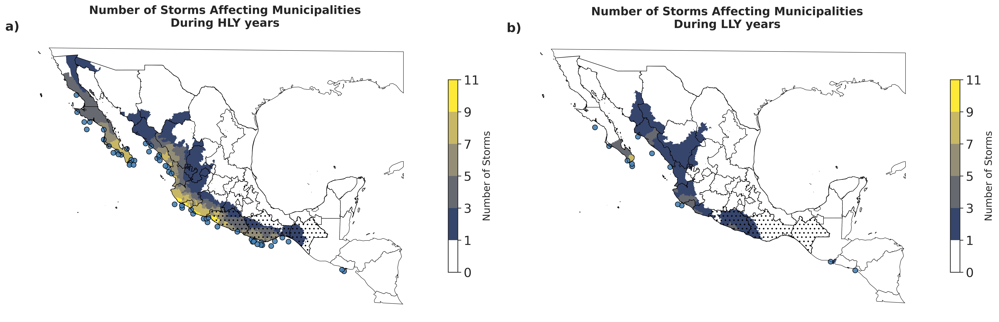

In [8]:
# Create a combined figure with two subplots (side by side)
fig, axs = plt.subplots(1, 2, figsize=(20, 8), dpi=350)

# Plot for LLF years on the left subplot
plot_storm_data(
    ax=axs[1],
    mun_counts=llf_mun_counts,
    landfall_points=llf_landfall_points,
    title="Number of Storms Affecting Municipalities\nDuring LLY years",
    central_america=central_america,
    mexico_states=mexico_states)

# Plot for HLF years on the right subplot
plot_storm_data(
    ax=axs[0],
    mun_counts=hlf_mun_counts,
    landfall_points=hlf_landfall_points,
    title="Number of Storms Affecting Municipalities\nDuring HLY years",
    central_america=central_america,
    mexico_states=mexico_states)

# Function to add subplot labels (a) and b))
def add_subplot_label(ax, label):
    ax.text(0.0, 1.05, label, transform=ax.transAxes,
            fontsize=18, fontweight='bold', va='top', ha='right')

add_subplot_label(axs[0], "a)")
add_subplot_label(axs[1], "b)")

plt.tight_layout()
# plt.savefig('../ENP-Tropical-Cyclones-Landfall/Plots/ENP_Paper/Fig2_combined.png')
plt.show()

## Figure 3

### panel a

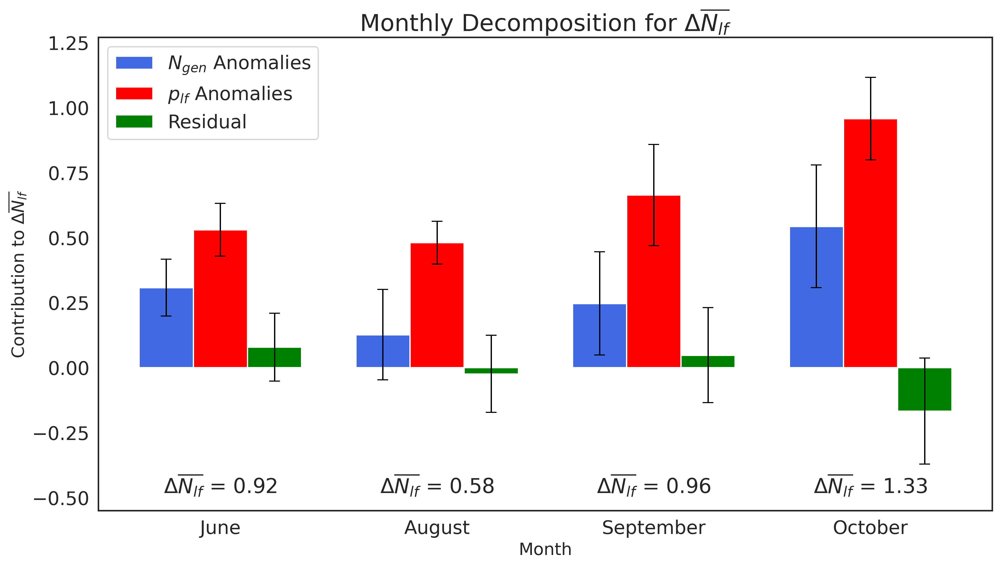

In [9]:
# Define the width of each bar and the positions along the x-axis
bar_width = 0.25
x_pos = np.arange(len(df_original))

fig, ax = plt.subplots(figsize=(15, 8), dpi=300)

# Plot the bars with error bars
ax.bar(x_pos, df_original['Gen_Anom'], bar_width,
       yerr=df_summary['Gen_Anom_err'], capsize=5,
       label=r'$N_{gen}$ Anomalies', color='royalblue')
ax.bar(x_pos + bar_width, df_original['Plf_anom'], bar_width,
       yerr=df_summary['Plf_anom_err'], capsize=5,
       label=r'$p_{lf}$ Anomalies', color='red')
ax.bar(x_pos + 2*bar_width, df_original['Res'], bar_width,
       yerr=df_summary['Res_err'], capsize=5,
       label='Residual', color='green')

# Annotate each bar with the DIFF value
for idx in x_pos:
    ax.text(idx + bar_width, -0.5,
            r'$\Delta \overline{N_{lf}}$ = ' + f'{df_original.loc[idx, "DIFF"]:.2f}',
            ha='center', va='bottom')

# Set labels and title
ax.set_xlabel('Month', fontsize=16)
ax.set_ylabel(r'Contribution to $\Delta \overline{N_{lf}}$', fontsize=16)
ax.set_title(r'Monthly Decomposition for $\Delta \overline{N_{lf}}$', fontsize=22)
ax.set_xticks(x_pos + bar_width)
ax.set_xticklabels(df_original['Month'])
ax.set_ylim(-0.55, 1.27)
ax.set_yticks([-0.5, -0.25, 0, 0.25, 0.5, 0.75, 1, 1.25])
ax.legend(loc='upper left')

plt.show()

### panel b

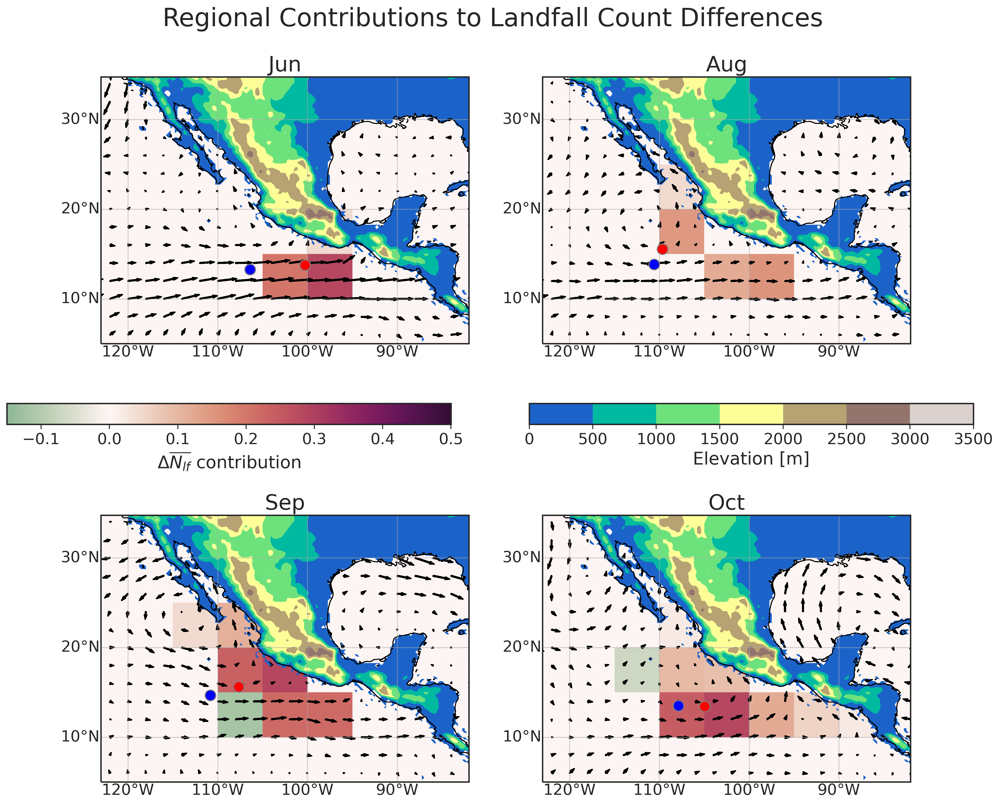

In [10]:
# Get the month names from the pprime dataset (e.g., ["June", "August", "September", "October"])
months = pprime_ds['month'].values
#create masked topo to don't have values on the ocean
topo_values = topography.values
min_elevation = 2  # Set to your desired minimum elevation level
masked_topography = np.ma.masked_less(topo_values, min_elevation)

# Mapping from month name to month number for filtering the wind datasets.
month_str_to_num = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5,
    'June': 6, 'July': 7, 'August': 8, 'September': 9, 'October': 10,
    'November': 11, 'December': 12,
    'Jan': 1, 'Feb': 2, 'Mar': 3, 'Apr': 4, 'May': 5,
    'Jun': 6, 'Aug': 8, 'Sep': 9, 'Oct': 10, 'Nov': 11, 'Dec': 12
}

# --- CREATE THE FIGURE ---
fig, axs = plt.subplots(2, 2, subplot_kw={'projection': ccrs.PlateCarree()},
                        figsize=(15, 15), dpi=300)
axs = axs.flatten()

# Define colormap and normalization for the pcolormesh plot
cmap_hist = cmocean.cm.curl  # Choose a colormap
norm_hist = MidpointNormalize(vmin=-0.15, vmax=0.5, midpoint=0)

# --- LOOP OVER EACH MONTH ---
for ax, month in zip(axs, months):
    # Extract the pprime term (a 2D array) for this month.
    term = pprime_ds['pprime_term'].sel(month=month).values  # shape should be (nx, ny)
    
    # Get the x and y coordinate arrays (which we adjusted to match term’s dimensions)
    x_coords = pprime_ds['x'].values  # length nx
    y_coords = pprime_ds['y'].values  # length ny
    x_edges = np.array([-130, -125, -120, -115, -110, -105, -100,  -95,  -90,  -85,  -80])
    y_edges = np.array([ 5, 10, 15, 20, 25, 30, 35])
    # Plot the pprime term with pcolormesh. (term.T is used if needed for proper orientation.)
    mesh = ax.pcolormesh(x_edges, y_edges, term.T, cmap=cmap_hist, norm=norm_hist,
                          transform=ccrs.PlateCarree())

    # --- WIND DIFFERENCE (QUIVER) ---
    # Convert the month to a number (e.g., "June" -> 6)
    mnum = month_str_to_num[month]

    # Average the wind fields for the given month.
    u_hlf = U_hlf['u'].where(U_hlf['time'].dt.month == mnum, drop=True).mean(dim='time')
    v_hlf = V_hlf['v'].where(V_hlf['time'].dt.month == mnum, drop=True).mean(dim='time')
    u_llf = U_llf['u'].where(U_llf['time'].dt.month == mnum, drop=True).mean(dim='time')
    v_llf = V_llf['v'].where(V_llf['time'].dt.month == mnum, drop=True).mean(dim='time')

    # Compute the differences between HLF and LLF fields.
    u_diff = u_hlf - u_llf
    v_diff = v_hlf - v_llf

    # Create a meshgrid for the quiver plot using the wind field coordinates.
    lon = u_hlf['longitude'].values
    lat = u_hlf['latitude'].values
    Lon, Lat = np.meshgrid(lon, lat)
    # Subsample the grid for clarity (adjust step and scale as needed).
    step = 8
    ax.quiver(Lon[::step, ::step], Lat[::step, ::step],
              u_diff.values[::step, ::step], v_diff.values[::step, ::step],
              transform=ccrs.PlateCarree(),
             color='k', units='width',scale = 40, linewidth=1.10, edgecolor='face')

    # --- PLOT MEAN GENESIS LOCATIONS ---
    # Retrieve mean lat/lon for both LLF and HLF from the CSV file.
    row = df_means[df_means['Month'] == month]
    if not row.empty:
        llf_lat = row['LLF_mean_lat'].values[0]
        llf_lon = row['LLF_mean_lon'].values[0]
        hlf_lat = row['HLF_mean_lat'].values[0]
        hlf_lon = row['HLF_mean_lon'].values[0]
        # Plot the LLF point in blue.
        ax.plot(llf_lon, llf_lat, marker='o', markersize=11,
                color='blue', markeredgecolor='gray',
                transform=ccrs.PlateCarree(), label='LLF')
        # Plot the HLF point in red.
        ax.plot(hlf_lon, hlf_lat, marker='o', markersize=11,
                color='red', markeredgecolor='gray',
                transform=ccrs.PlateCarree(), label='HLF')

    # Add coastlines and set the extent for each subplot.
    cm = ax.contourf(topography.longitude, topography.latitude,masked_topography,
                     transform=ccrs.PlateCarree(), cmap='terrain', alpha=1.0)
        # Add coastlines, gridlines, and quiver plot to the subplot
    ax.coastlines()
    # ax.set_extent([x - 360 if i < 2 else x for i, x in enumerate(region)])
    ax.set_extent([-123, -82, 5, 33])
    gl = ax.gridlines(draw_labels=True, zorder=1, color = 'darkgray', alpha=0.6)
    gl.xlocator = mticker.FixedLocator(np.arange(-180, 181, 10))
    gl.ylocator = mticker.FixedLocator(np.arange(-90, 91, 10))
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlabels_top = gl.ylabels_right = False
    gl.xlines = gl.ylines = True
    gl.xlabel_style = {'size': 16}
    gl.ylabel_style = {'size': 16}
    ax.set_title(month, fontsize=22)


# --- ADD A GLOBAL COLORBAR ---

# Add a colorbar for the genesis density map
hist_cbar_ax = fig.add_axes([0.035, 0.5, 0.425, 0.02])  # Adjust the position and size as needed
hist_cbar = fig.colorbar(mesh, cax=hist_cbar_ax, orientation='horizontal')
hist_cbar.ax.tick_params(labelsize=16)
hist_cbar.set_label(r'$\Delta \overline{N_{lf}}$ contribution', fontsize=18)  # Set the label for the colorbar

# Add a colorbar for the topography
hist_cbar_ax = fig.add_axes([0.535, 0.5, 0.425, 0.02])  # Adjust the position and size as needed
hist_cbar = fig.colorbar(cm, cax=hist_cbar_ax, orientation='horizontal')
hist_cbar.ax.tick_params(labelsize=16)
hist_cbar.set_label('Elevation [m]', fontsize=18) 


plt.suptitle("Regional Contributions to Landfall Count Differences", fontsize=26, y =0.9)
# plt.tight_layout()
plt.show()

## Figure 4

### panal a

In [11]:
# Define the bounding boxes for the three regions
tehuantepec_box = [-96, -93.5, 14, 16]  # [min lon, max lon, min lat, max lat]
papagayo_box = [-89, -86, 12.3, 10]
specific_box = [-105, -95, 10, 15]
CLLJ_box = [-80,-70,12.5,17.5]
Monsoon_box = [-120,-90, 3, 15]

# Define a function to plot the boxes
def plot_box(ax, box, color, fill=True):
    lon_min, lon_max, lat_min, lat_max = box
    ax.add_patch(mpatches.Rectangle(xy=[lon_min, lat_min], width=lon_max-lon_min, height=lat_max-lat_min,
                                    transform=ccrs.PlateCarree(),
                                    fill=fill, color=color, alpha=0.4, edgecolor='black'))
# modified version, with zorder, and linewidth
def plot_box2(ax, box, color, linewidth, z, fill=True):
    lon_min, lon_max, lat_min, lat_max = box
    ax.add_patch(mpatches.Rectangle(xy=[lon_min, lat_min], width=lon_max-lon_min, height=lat_max-lat_min,
                                    transform=ccrs.PlateCarree(),
                                    fill=fill, color=color, alpha=0.75, edgecolor='black',
                                    linewidth=linewidth, zorder=z))

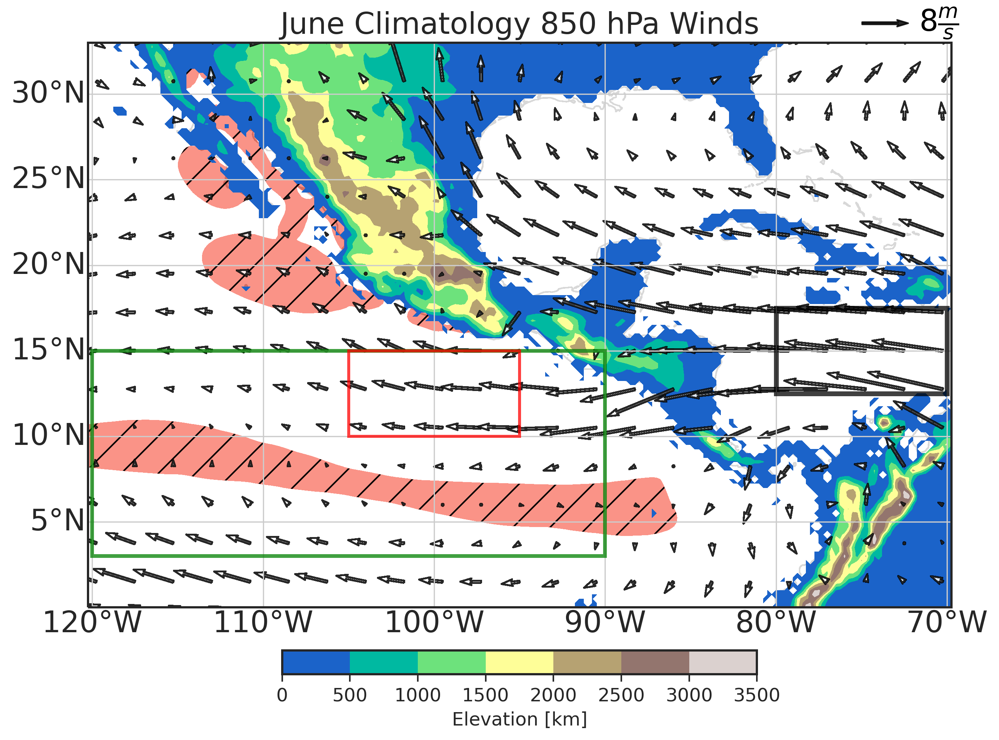

In [12]:
# Set up the map projection and create a new figure
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': proj}, dpi=300)

# Add features to the map
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS, linestyle=':')

# Set the extent of the map (you can adjust this as needed)
ax.set_extent([-120.25, -69.75, 0, 33], crs=ccrs.PlateCarree())
longitudes = np.arange(200, 320.25, 0.25) 
latitudes = np.arange(40, -10.25, -0.25) 

# Extract the topography data (replace 'elevation' with the name of your data variable)
topo_values = topography.values
min_elevation = 2  # Set to your desired minimum elevation level
masked_topography = np.ma.masked_less(topo_values, min_elevation)
fc = ax.contourf(longitudes,latitudes,dns,
     transform=ccrs.PlateCarree(), extend='both', add_colorbar=False,
    levels=[0,2.,7.0], colors=['white','salmon'], hatches=['/', None], alpha=0.85)
cm = ax.contourf(topography.longitude, topography.latitude,masked_topography,
            transform=ccrs.PlateCarree(), cmap='terrain', alpha=1)

# Plot the boxes for each region
plot_box2(ax, specific_box, 'red', fill=False, linewidth=1.9, z=4)
plot_box2(ax,CLLJ_box,'black',fill=False, linewidth=3,z=3)
plot_box2(ax,Monsoon_box,'green',fill=False, linewidth=2,z=3)

# Add wind vectors
# Plot the wind data on the subplot in vectors
X = u_july_climo.longitude.data
Y = u_july_climo.latitude.data
XX, YY = np.meshgrid(X, Y)
uu = u_july_climo.u
vv = v_july_climo.v
n=9 #12 is cool for presentations
mag = np.sqrt((uu[::n, ::n])**2 + (vv[::n, ::n])**2)
Q = ax.quiver(X[::n], Y[::n], uu[::n, ::n], vv[::n, ::n], color='white', linewidth=1.02, edgecolor='black',
              units='width', scale = 150,  transform=ccrs.PlateCarree(), alpha=0.85)
#for scale bigger the factor smaller the arrows
qk = ax.quiverkey(Q, 0.95, 1.035, 8, r'$8 \frac{m}{s}$', labelpos='E',
              coordinates='axes', color='k', labelcolor='k')


# Add gridlines and labels
gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
gl.top_labels = False
gl.right_labels = False

# Add a colorbar to the map
cbar = plt.colorbar(cm, ax=ax, orientation='horizontal', shrink=0.55, pad=0.05)
cbar.set_label('Elevation [km]', fontsize=12)
cbar.ax.tick_params(labelsize=12)
plt.title('June Climatology 850 hPa Winds')

# Show the plot
plt.show()

### panel c

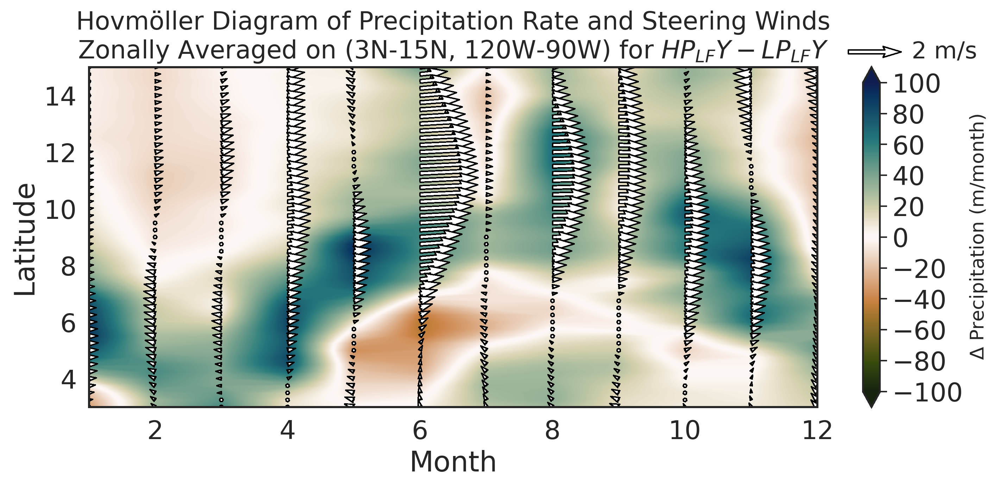

In [13]:
#%% Define the region (longitude in degrees west and latitude in degrees north)
# Note: R = [lon_min, lon_max, lat_min, lat_max]
R = [-120, -90, 3, 15]


# Calculate the difference (hlf - llf) and apply normalization to convert rate to accumulated precipitation
TP_diff = (TP_Hov_hlf - TP_Hov_llf) * 86400  # converts from rate (m/s) to m/day

days_in_month = np.array([31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31])
TP_Hov_scaled = TP_diff.copy()

# Multiply each month's difference by the number of days in that month
for i in range(12):
    TP_Hov_scaled.loc[{'month': i+1}] *= days_in_month[i]


#%% Process wind fields (using variables from your wind datasets)
u_Hov_hlf = U_hlf.sel(longitude=slice(R[0] + 360, R[1] + 360), 
                         latitude=slice(R[3], R[2]), drop=True)
u_Hov_hlf = u_Hov_hlf.groupby('time.month').mean('time')
u_Hov_hlf = u_Hov_hlf.mean(dim='longitude')

u_Hov_llf = U_llf.sel(longitude=slice(R[0] + 360, R[1] + 360), 
                         latitude=slice(R[3], R[2]), drop=True)
u_Hov_llf = u_Hov_llf.groupby('time.month').mean('time')
u_Hov_llf = u_Hov_llf.mean(dim='longitude')

v_Hov_hlf = V_hlf.sel(longitude=slice(R[0] + 360, R[1] + 360), 
                         latitude=slice(R[3], R[2]), drop=True)
v_Hov_hlf = v_Hov_hlf.groupby('time.month').mean('time')
v_Hov_hlf = v_Hov_hlf.mean(dim='longitude')

v_Hov_llf = V_llf.sel(longitude=slice(R[0] + 360, R[1] + 360), 
                         latitude=slice(R[3], R[2]), drop=True)
v_Hov_llf = v_Hov_llf.groupby('time.month').mean('time')
v_Hov_llf = v_Hov_llf.mean(dim='longitude')

# Compute wind differences (hlf - llf)
u_Hov_diff = u_Hov_hlf - u_Hov_llf
v_Hov_diff = v_Hov_hlf - v_Hov_llf

#%% Plotting the Hovmöller diagram for precipitation rate differences and wind vectors
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

# Create a filled contour plot for the precipitation difference (in m/month)
fc = ax.contourf(TP_Hov_scaled.month, TP_Hov_scaled.latitude, TP_Hov_scaled.avg_tprate.data.T,
                 extend='both', levels=np.arange(-100.0, 100.2, 0.2), cmap=cmocean.cm.tarn)

# Adjust arrow parameters
arrow_scale = 2.5    # Change this value for different arrow sizes
slice_step = 1       # Increase for fewer arrows

# Slice wind data to reduce arrow density
u_Hov_sliced = u_Hov_diff.u[::slice_step, ::slice_step]
v_Hov_sliced = v_Hov_diff.v[::slice_step, ::slice_step]
lat_sliced = u_Hov_diff.latitude[::slice_step]
month_sliced = u_Hov_diff.month[::slice_step]

# Plot the quiver (wind vectors)
Q = ax.quiver(month_sliced, lat_sliced, u_Hov_sliced.T, v_Hov_sliced.T, 
              scale=arrow_scale, color='white', edgecolor='black', 
              linewidth=0.7, angles='xy', scale_units='xy', width=0.005, alpha=1)

# Add a quiver key to indicate the vector magnitude
qk = ax.quiverkey(Q, 1.115, 1.045, 2, '2 m/s', labelpos='E', 
                  coordinates='axes', fontproperties={'size':16})

# Add a colorbar, titles, and axis labels
cb = plt.colorbar(fc, ax=ax, extend='both', ticks=np.arange(-100, 101, 20))
cb.set_label('$\Delta$ Precipitation (m/month)', fontsize=13)
ax.set_title('Hovmöller Diagram of Precipitation Rate and Steering Winds\nZonally Averaged on (3N-15N, 120W-90W) for $HP_{LF}Y-LP_{LF}Y$', fontsize=17)
ax.set_xlabel('Month')
ax.set_ylabel('Latitude')

plt.tight_layout()
# plt.savefig('../ENP-Tropical-Cyclones-Landfall/Plots/ENP_Paper/Fig4b.png')
plt.show()

### panel c

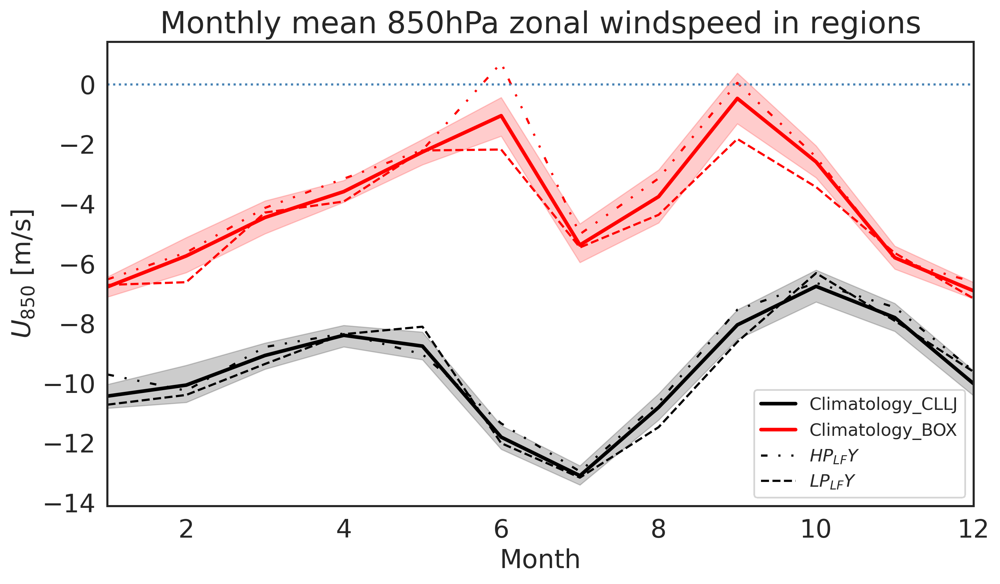

In [14]:
# Convert xarray DataArray to pandas DataFrame without taking the mean, so we keep all the years
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)
fig.set_facecolor('white')

# Plot Climatology with 95% confidence interval (CI)
sns.lineplot(data=df4[df4['Category'] == 'Climatology'], x='month', y='u',
             label='Climatology_CLLJ', color='k', ci=95, linewidth=2.5, ax=ax)
sns.lineplot(data=df4[df4['Category'] == 'Climatology_BOX'], x='month', y='u',
             label='Climatology_BOX', color='red', ci=95, linewidth=2.5, ax=ax)

# Plot HLF and LLF without CI
sns.lineplot(data=df4[df4['Category'] == 'HLF'], x='month', y='u',
             label='$HP_{LF}Y$', color='k', 
             linestyle=(0, (3, 5, 1, 5, 1, 5)), linewidth=1.5, ax=ax)
sns.lineplot(data=df4[df4['Category'] == 'HLF_BOX'], x='month', y='u',
             color='red', linestyle=(0, (3, 5, 1, 5, 1, 5)), linewidth=1.5, ax=ax)
sns.lineplot(data=df4[df4['Category'] == 'LLF'], x='month', y='u',
             label='$LP_{LF}Y$', color='k', linestyle='--', linewidth=1.5, ax=ax)
sns.lineplot(data=df4[df4['Category'] == 'LLF_BOX'], x='month', y='u',
             color='red', linestyle='--', linewidth=1.5, ax=ax)

# Add horizontal line at zero
ax.axhline(y=0, color='steelblue', linestyle=':', linewidth=1.5)

# Set plot limits and labels
ax.set_xlim([1, 12])
ax.set_xlabel('Month', fontsize=18)
ax.set_ylabel(r'$U_{850}$ [m/s]', fontsize=18)
ax.set_title(r"Monthly mean 850hPa zonal windspeed in regions", fontsize=21)
plt.legend(loc=4, prop={'size': 12})
plt.tight_layout()

# Save and show the figure
plt.savefig("line_plot.png")
plt.show()